In [1]:
# !pip3 install scikit-learn termcolor

In [2]:
import numpy as np 
import matplotlib.pyplot as plt 
import sklearn as skl
from termcolor import colored

# Classification

Suppose we have a set of objects, described by their features $x^{(k)}$, and labels $l^{(k)}$ assigned to the objects.
Doing statistical classification we find the rule $f$ that maps $x^{(k)}$ to $l^{(k)}$ and generalize the rule to all possible objects.
For example, given samples of handwritten digits, problem of statistical classification is to assign the correct digit to an arbitrary character.

From mathematical point of view, the classifier $f$ is a mapping from the vector space $\mathbb R^N$ of all features $x$  to the vector space $\mathbb R^M$ of scores $p$, where $N$ is the number of features, and $M$ is the number of classes. In the simplest case the output of the classifier can be the class/label $l$ itself, but usage of scores instead of labels have several benefits: (1) the score shows confidence in the result, (2) scores are differentiable what is a desirable property for machine learning, (3) cross-entropy loss function can be used. 
It is convenient to consider score $p_l$ as the probability of $x$ to belong to the class $l$, therefore $p$ should be properly normalized: 
$p_l\geq 0$, $\sum_l p_l=1$.

In ML the classifier $f(\cdot|\theta)$ is taken from a predefined set, chosen to match known properties of the problem. 
Then the parameters $\theta$ of the classifier are tuned to match the training set $x^{train,k}$, $p^{train,k}$ in the best possible way.
Two method are most popular for training the classifier: (1) point estimation of $\theta$, e.g. maximum likelyhood method, and (2) Bayesian inference capable of estimation of probability distribution of $\theta$.

## Point estimation

Suppose $f(x|\theta)=p$ is the probability destribution of $x$ to belong to each class for specified parameters $\theta$ pf the classifier.
If the exact distribution is known, denote it by $\hat{p}(x)$, than the performance of the classifier can be estimated by the cross entropy function:
$$
H(p,\hat{p})=-\sum_l p_l\log \hat{p}(x)_l.
$$
In applications the distribution is rarely known, instead samples $l^{k}$ of $p(x)$ are known.
In the case the cross entropy can be estimated by the following statistics:
$$
H(p,\hat{p})\approx -S^{-1}\sum_k \log \hat{p}(x)_{l^{(k)}},
$$ 
where $S$ is total number of samples.
To estimate the performance of the estimate $\theta$ on all objects $x$, 
an averaging over all $x$ is applied, 
$$
E_x[H|\theta]\approx L[x,y|\theta]=-S^{-1}\sum_k \log \hat{p}(x^{(k)})_{l^{(k)}}. 
$$
The training of the classifier is just minimization of the loss function on the training set:
$$
\hat\theta = \mathrm{argmin}_\theta L[x^{train,k}|\theta), y^{train,k}|\theta].
$$



One of the simplest classifiers is linear classifier. Assume that there are only two possible classes for $x$ to belong to. 
Than the distribution $p$ is defined by the single value $p_0\in[0,1]$ defining the probability of $x$ to belong to the class $0$.
The linear classifier assumes that classes are separated by a hyperplane, therefore the score is computed by:
$$
p_0(x|\theta)=f(x\cdot\theta)=f(\sum_j x_j \theta_j),
$$
where common choice for the activation function $f$ are step function and logistic function $
f(a)=(1+e^{-x})^{-1}.
$
Applying a fixed non-linear tranform $T$ to the points $x$ before evaluation of the inner product,
$$
p_0(x|\theta)=f(T(x)\cdot\theta)=f(\sum_j T(x)_j \theta_j),
$$
effectively transforms the dividing hyperplane to arbitrary complex hypersurface, 
thus hugely increasing class of the problems solvable by the linear regression.
The transform $T$ can even map every element $x$ to several features, e.g. polynomial basis,
allowing reconstruction of almost arbitrary dependence in data.
Increasing number of features can potentialy significantly slow down computation,
but [kernel trick](https://en.wikipedia.org/wiki/Kernel_method) can be used to even infinite number of features without overhead.




## Performance metrics

Performance of the classifier can be estimated using [confusion matrix](https://en.wikipedia.org/wiki/Confusion_matrix) 
and derived metrics such as [precision and recall](https://en.wikipedia.org/wiki/Precision_and_recall) for binary classifiers.
The metrics can be misleading, if the data is unbalanced, that is if numbers of positive and negative cases are significantly different. 

If a classifier returns score for each class, than boundary between classes are determined by the threshold value. 
The best possible value can be estimated from [Receiver operating characteristic (ROC) curve](https://en.wikipedia.org/wiki/Receiver_operating_characteristic),
which is dependence of true positive cases on false positive. 
The best threshold corresponds to upper left point on the plot.
The area under the ROC curve is also used to compare different classifiers.


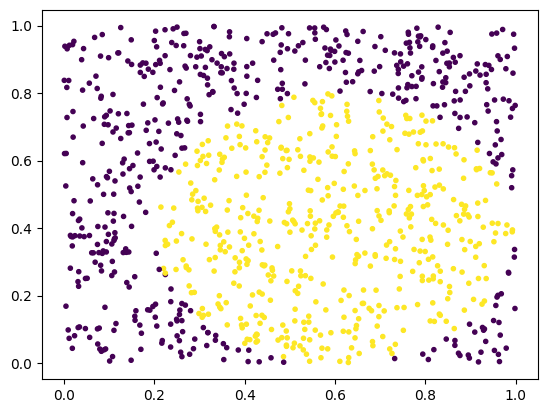

In [3]:
def visualize(x=None, y=None, y_predicted=None, axis=None):
    nitems = x.shape[0]
    assert y.shape == (nitems,)    
    assert x.ndim == 2 

    if y_predicted is not None:
        assert y_predicted.shape == y.shape
        wrong_predictions = y!=y_predicted
    else:
        wrong_predictions = slice(0)
    
    if axis is None:
        _fig, axis = plt.subplots()
        
    if x.shape[1] == 2: # Scatter plot vizualization
        axis.scatter(x=x[wrong_predictions,0], y=x[wrong_predictions,1], c='r', marker=',')
        axis.scatter(x=x[:,0], y=x[:,1], c=y, marker='.')
    else: # Function plot
        axis.plot(x[wrong_predictions,:], c='r', linestyle='solid', linewidth=3)
        axis.plot(x[y==0,:].T, c='y', linestyle='solid')
        axis.plot(x[y==1,:].T, c='b', linestyle='solid')        
        
        

class TestProblem:
    def sample(self, nitems: int) -> (np.ndarray, np.ndarray):
        raise NotImplementedError

    def visualize(self, nitems=1000, axis=None):
        x, y = self.sample(nitems=nitems)
        visualize(x=x, y=y, axis=axis)

class CircleProblem(TestProblem):
    def __init__(self, center: np.ndarray, radius: float):
        self._center = np.array(center)
        assert self._center.ndim == 1
        self._radius = np.float32(radius)

    def sample(self, nitems):
        x = np.random.rand(nitems, self._center.shape[0])
        distance_to_the_center = np.linalg.norm(x-self._center[None], ord=2, axis=-1)
        y = distance_to_the_center<self._radius
        return x, y

problem = CircleProblem(center=(0.6, 0.4), radius=0.4)
problem.visualize()
plt.show()

Training data:
Confusion matrix:
 [[490  10]
 [  7 493]]
Recall 98.00%, precision 98.59%, f1-measure 98.29%
Test data:
Confusion matrix:
 [[45  0]
 [ 1 54]]
Recall 100.00%, precision 97.83%, f1-measure 98.90%


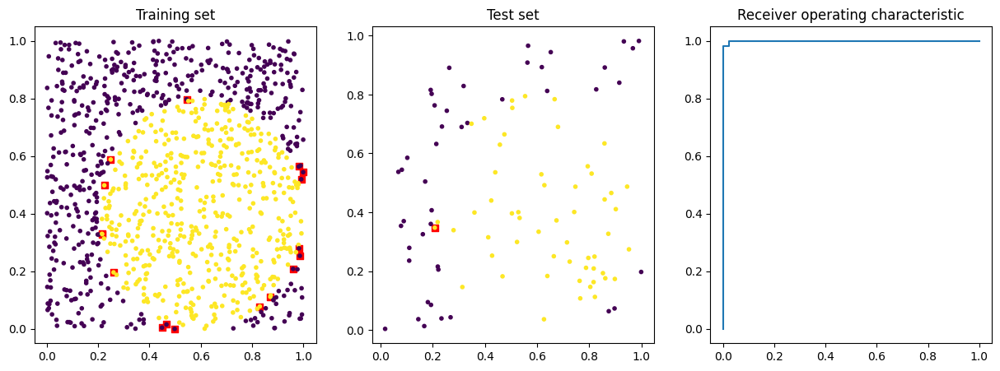

In [4]:
from sklearn import metrics

def confusion_matrix(y, y_predicted):
    mx = np.maximum(np.max(y),np.max(y_predicted))
    confusion_matrix = np.zeros((mx+1, mx+1), dtype=np.int32)
    for r, c in zip(y,y_predicted):
        confusion_matrix[r,c] += 1
    return confusion_matrix

def print_metrics(y, y_predicted):
    y = np.array(y, dtype=np.int8)
    y_predicted = np.array(y_predicted, dtype=np.int8)
    
    cm = confusion_matrix(y,y_predicted)
    print(f"Confusion matrix:\n", cm)

    if cm.shape[0]==2:
        (TP, FN), (FP, TN) = cm
        recall = TP/(TP+FN)
        precision = TP/(TP+FP)
        f1 = 2*TP/(2*TP+FP+FN)
        print(f"Recall {100*recall:.2f}%, precision {100*precision:.2f}%, f1-measure {100*f1:.2f}%")

def benchmark_classifier(clf, problem, n_training_samples=1000, n_test_samples=100):
    training_x, training_y = problem.sample(nitems=n_training_samples)
    test_x, test_y = problem.sample(nitems=n_test_samples)

    clf.fit(training_x, training_y)

    y_predicted = clf.predict(training_x)
    y_predicted_test = clf.predict(test_x)

    print(colored("Training data:","yellow"))
    print_metrics(training_y, y_predicted)

    print(colored("Test data:",'green'))
    print_metrics(test_y, y_predicted_test)


    fig, (axis1, axis2, axis3) = plt.subplots(ncols=3, figsize=(15, 5))

    visualize(training_x, training_y, y_predicted, axis=axis1)
    axis1.set_title('Training set')

    visualize(test_x, test_y, y_predicted_test, axis=axis2)
    axis2.set_title('Test set')

    scores = clf.decision_function(test_x)
    fpr, tpr, thresholds = metrics.roc_curve(test_y, scores)
    axis3.plot(fpr, tpr)
    axis3.set_title('Receiver operating characteristic')

    plt.show()



from sklearn import svm
clf = svm.SVC()
benchmark_classifier(clf, problem)


## Problems:

1. `CircleProblem` above is an example of complete separation problem, that is a unique class is assigned deterministically to every features vector. However, in many cases the boundary between the classes are blured or the classes overlap. That means that in general only probability distribution of the classes can be defined. 
As an example, consider a test binary classification problem `GaussProblem`, such that an object described by a vector from $\mathbb R^N$ belongs to the first (positives) class with the probability defined by the [multivariate normal distribution](https://en.wikipedia.org/wiki/Multivariate_normal_distribution). The class of every object in the training/test is uniquely defined, despite the fact that the same object can belong to different classes on multiple occurances in the set. Define a class implementing the problem settings.

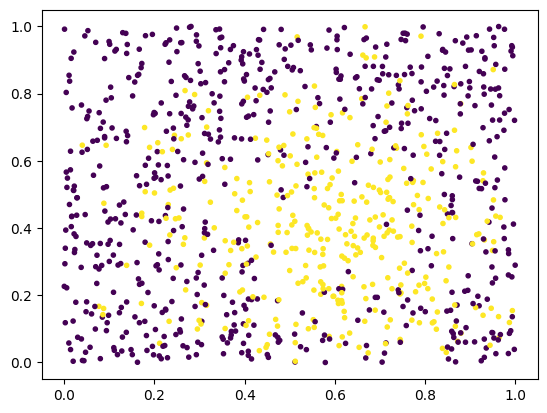

In [5]:
class GaussProblem(TestProblem):
    def __init__(self, center: np.ndarray, radius: float):
        self._center = np.array(center)
        assert self._center.ndim == 1
        self._radius = np.float32(radius)
        
    def score(self, points):
        assert points.ndim==2 and points.shape[1]==self._center.shape[0]
        distance_to_center_squared = np.sum( (points-self._center[None])**2, axis=-1)
        return np.exp(-distance_to_center_squared/(2*self._radius**2))

    def sample(self, nitems):
        x = np.random.rand(nitems, self._center.shape[0])
        zero_class_probability = self.score(x)
        y = np.random.rand(nitems)<=zero_class_probability
        return x, y

problem = GaussProblem(center=(0.6, 0.4), radius=0.25)
problem.visualize()
plt.show()

Training data:
Confusion matrix:
 [[601  54]
 [157 188]]
Recall 91.76%, precision 79.29%, f1-measure 85.07%
Test data:
Confusion matrix:
 [[60  2]
 [16 22]]
Recall 96.77%, precision 78.95%, f1-measure 86.96%


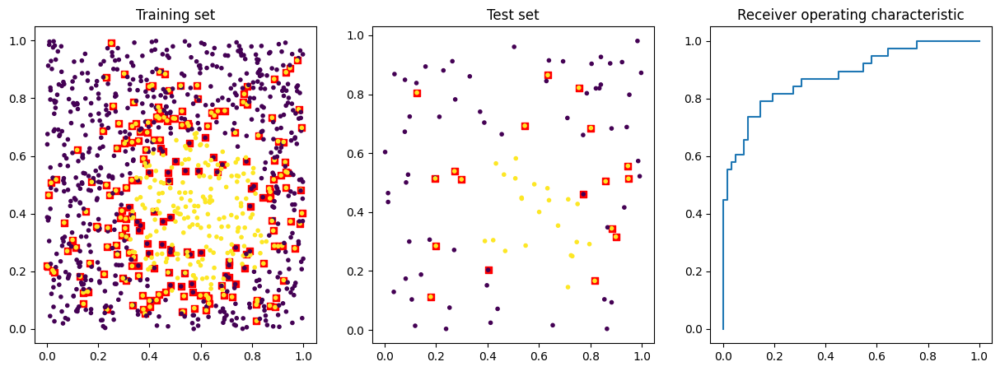

In [6]:
benchmark_classifier(clf, problem)

2. Boundary between the classes in `GaussProblem` is blured in contrast to `CircleProblem`. How does the bluring affect classification metrics?

The results above present that blur results in significant decrease of all metrics: recall, precision and f1-score. Moreover, visualized part present many more points of intersection in the training set and in the test set as well. With ROC-curve one can also notive the metrics decrease: the upper left corner, which is usually considered as optimal in study process, in this case is located more far from "the perfect point" (0,1).

3. Check parameters of the classifiers and tune them to avoid overfitting.

Testing C=0.01, gamma=0.01
Training data:
Confusion matrix:
 [[649   0]
 [351   0]]
Recall 100.00%, precision 64.90%, f1-measure 78.71%
Test data:
Confusion matrix:
 [[69  0]
 [31  0]]
Recall 100.00%, precision 69.00%, f1-measure 81.66%


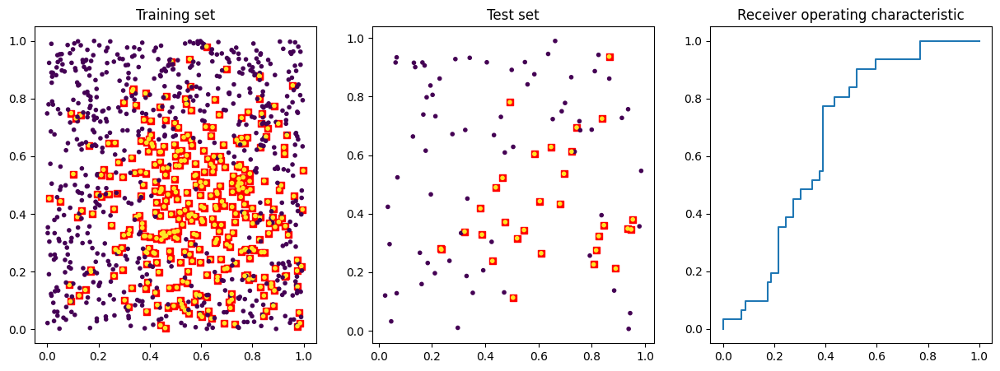

Testing C=0.01, gamma=0.1
Training data:
Confusion matrix:
 [[640   0]
 [360   0]]
Recall 100.00%, precision 64.00%, f1-measure 78.05%
Test data:
Confusion matrix:
 [[66  0]
 [34  0]]
Recall 100.00%, precision 66.00%, f1-measure 79.52%


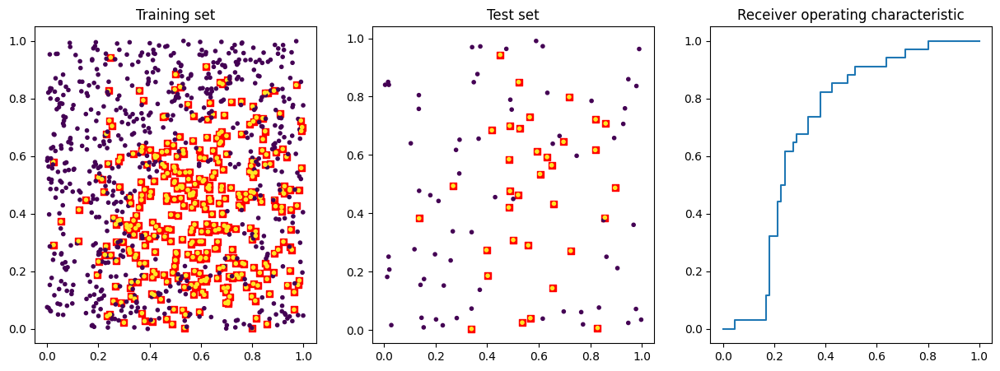

Testing C=0.01, gamma=1
Training data:
Confusion matrix:
 [[663   0]
 [337   0]]
Recall 100.00%, precision 66.30%, f1-measure 79.74%
Test data:
Confusion matrix:
 [[59  0]
 [41  0]]
Recall 100.00%, precision 59.00%, f1-measure 74.21%


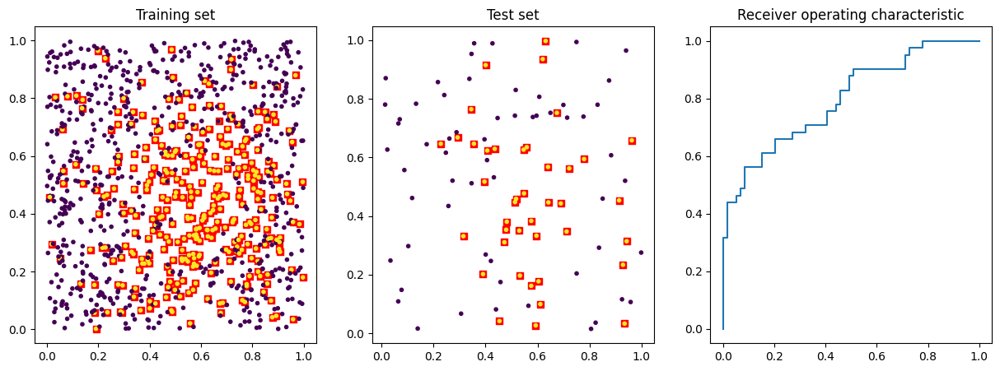

Testing C=0.01, gamma=10
Training data:
Confusion matrix:
 [[663   0]
 [337   0]]
Recall 100.00%, precision 66.30%, f1-measure 79.74%
Test data:
Confusion matrix:
 [[75  0]
 [25  0]]
Recall 100.00%, precision 75.00%, f1-measure 85.71%


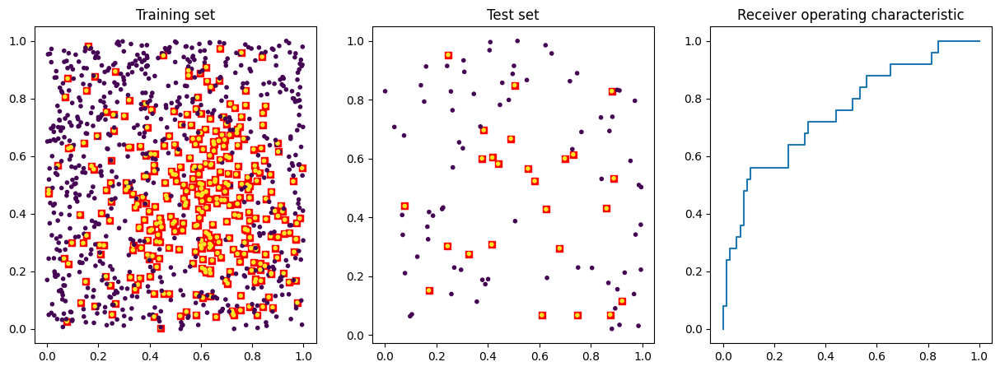

Testing C=0.01, gamma=100
Training data:
Confusion matrix:
 [[657   0]
 [343   0]]
Recall 100.00%, precision 65.70%, f1-measure 79.30%
Test data:
Confusion matrix:
 [[67  0]
 [33  0]]
Recall 100.00%, precision 67.00%, f1-measure 80.24%


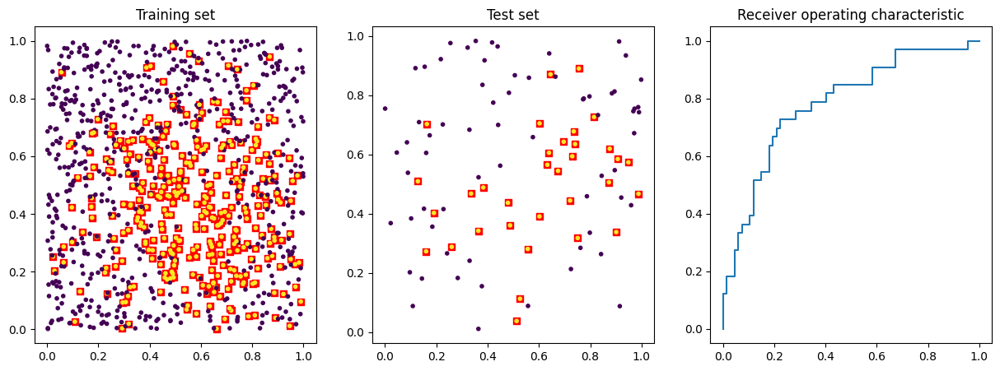

Testing C=0.1, gamma=0.01
Training data:
Confusion matrix:
 [[645   0]
 [355   0]]
Recall 100.00%, precision 64.50%, f1-measure 78.42%
Test data:
Confusion matrix:
 [[62  0]
 [38  0]]
Recall 100.00%, precision 62.00%, f1-measure 76.54%


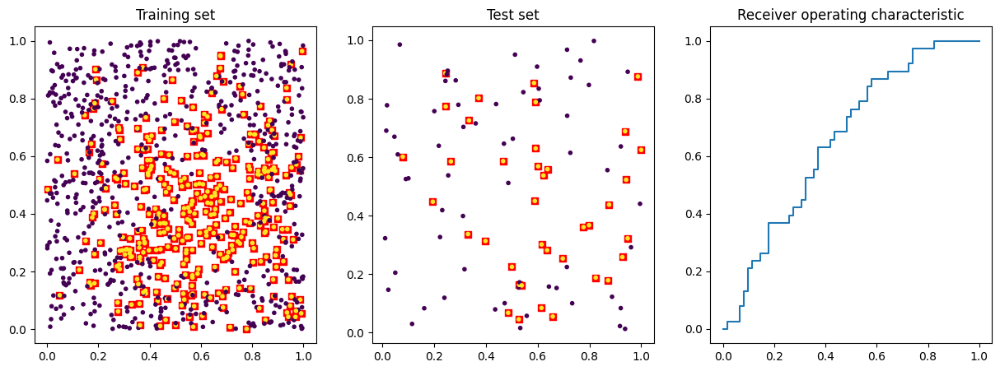

Testing C=0.1, gamma=0.1
Training data:
Confusion matrix:
 [[643   0]
 [357   0]]
Recall 100.00%, precision 64.30%, f1-measure 78.27%
Test data:
Confusion matrix:
 [[77  0]
 [23  0]]
Recall 100.00%, precision 77.00%, f1-measure 87.01%


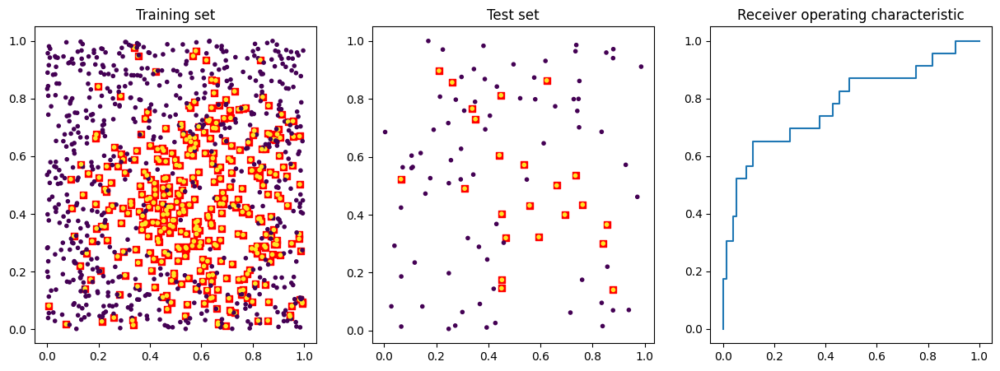

Testing C=0.1, gamma=1
Training data:
Confusion matrix:
 [[653   0]
 [347   0]]
Recall 100.00%, precision 65.30%, f1-measure 79.01%
Test data:
Confusion matrix:
 [[60  0]
 [40  0]]
Recall 100.00%, precision 60.00%, f1-measure 75.00%


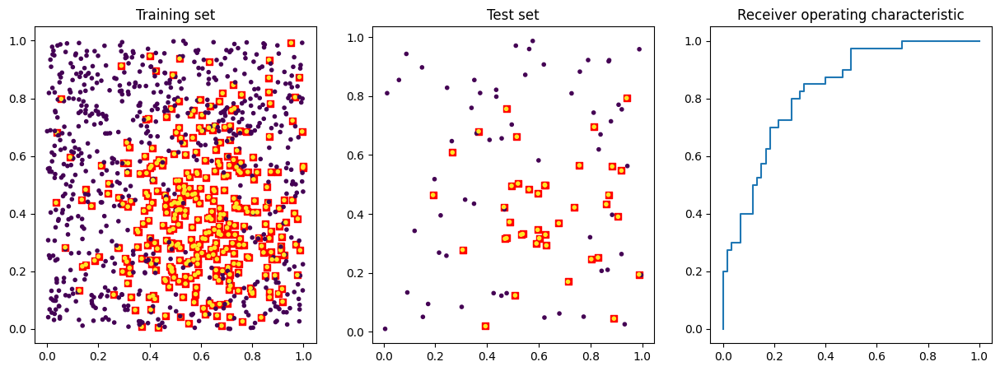

Testing C=0.1, gamma=10
Training data:
Confusion matrix:
 [[611  48]
 [169 172]]
Recall 92.72%, precision 78.33%, f1-measure 84.92%
Test data:
Confusion matrix:
 [[63  4]
 [21 12]]
Recall 94.03%, precision 75.00%, f1-measure 83.44%


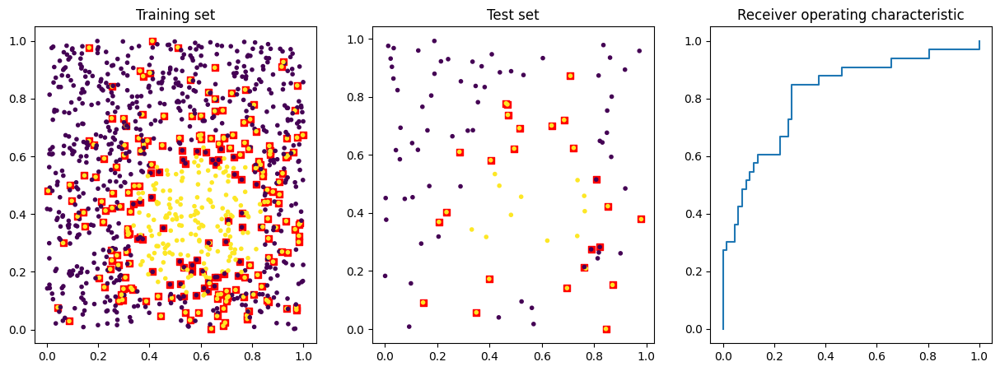

Testing C=0.1, gamma=100
Training data:
Confusion matrix:
 [[623  43]
 [202 132]]
Recall 93.54%, precision 75.52%, f1-measure 83.57%
Test data:
Confusion matrix:
 [[65  2]
 [16 17]]
Recall 97.01%, precision 80.25%, f1-measure 87.84%


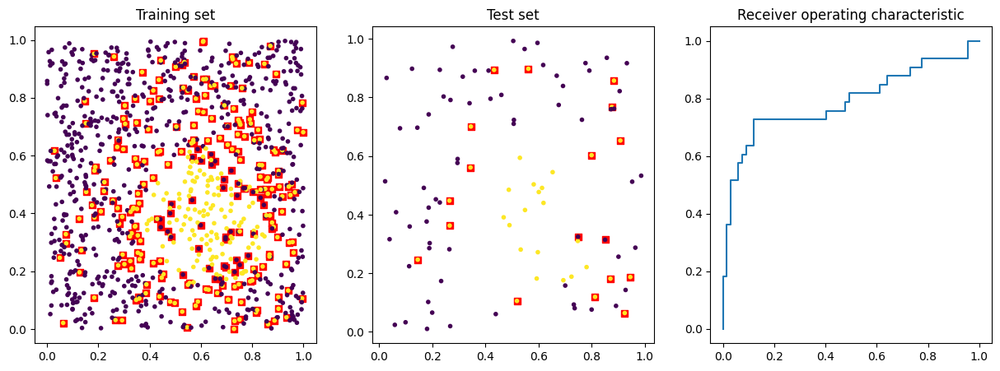

Testing C=1, gamma=0.01
Training data:
Confusion matrix:
 [[635   0]
 [365   0]]
Recall 100.00%, precision 63.50%, f1-measure 77.68%
Test data:
Confusion matrix:
 [[74  0]
 [26  0]]
Recall 100.00%, precision 74.00%, f1-measure 85.06%


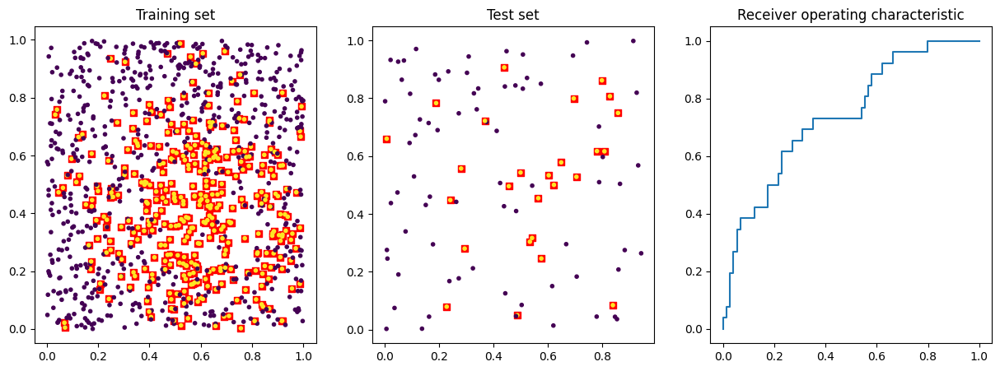

Testing C=1, gamma=0.1
Training data:
Confusion matrix:
 [[670   0]
 [330   0]]
Recall 100.00%, precision 67.00%, f1-measure 80.24%
Test data:
Confusion matrix:
 [[65  0]
 [35  0]]
Recall 100.00%, precision 65.00%, f1-measure 78.79%


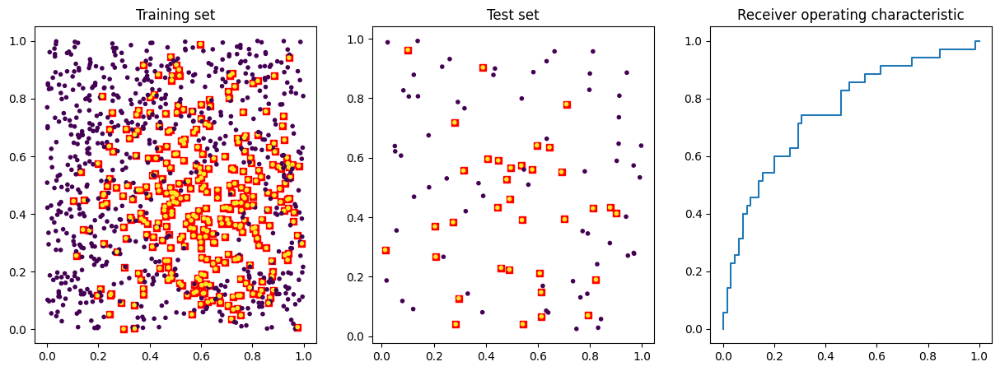

Testing C=1, gamma=1
Training data:
Confusion matrix:
 [[590  78]
 [122 210]]
Recall 88.32%, precision 82.87%, f1-measure 85.51%
Test data:
Confusion matrix:
 [[53  7]
 [17 23]]
Recall 88.33%, precision 75.71%, f1-measure 81.54%


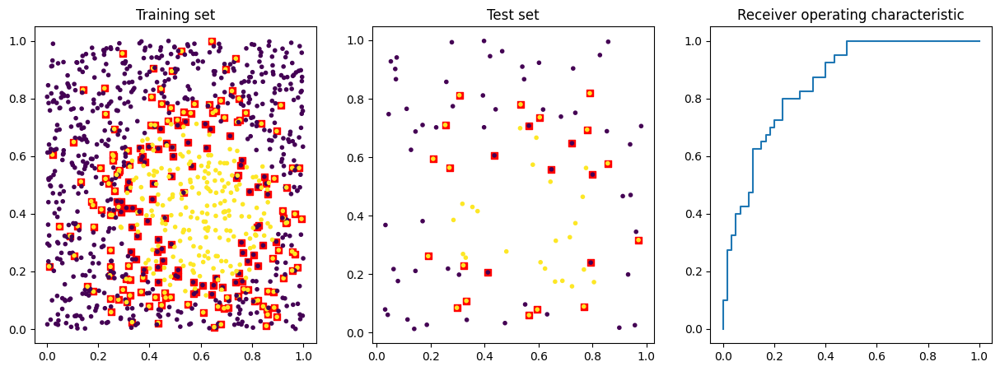

Testing C=1, gamma=10
Training data:
Confusion matrix:
 [[584  60]
 [137 219]]
Recall 90.68%, precision 81.00%, f1-measure 85.57%
Test data:
Confusion matrix:
 [[56 12]
 [12 20]]
Recall 82.35%, precision 82.35%, f1-measure 82.35%


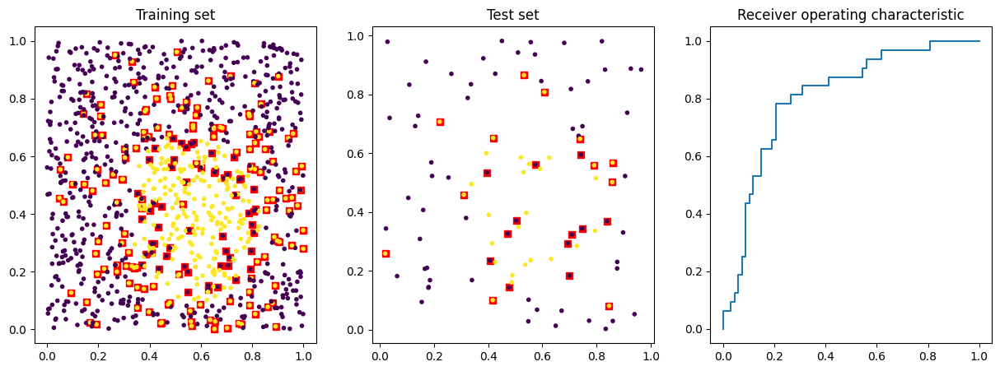

Testing C=1, gamma=100
Training data:
Confusion matrix:
 [[566  90]
 [125 219]]
Recall 86.28%, precision 81.91%, f1-measure 84.04%
Test data:
Confusion matrix:
 [[56  9]
 [18 17]]
Recall 86.15%, precision 75.68%, f1-measure 80.58%


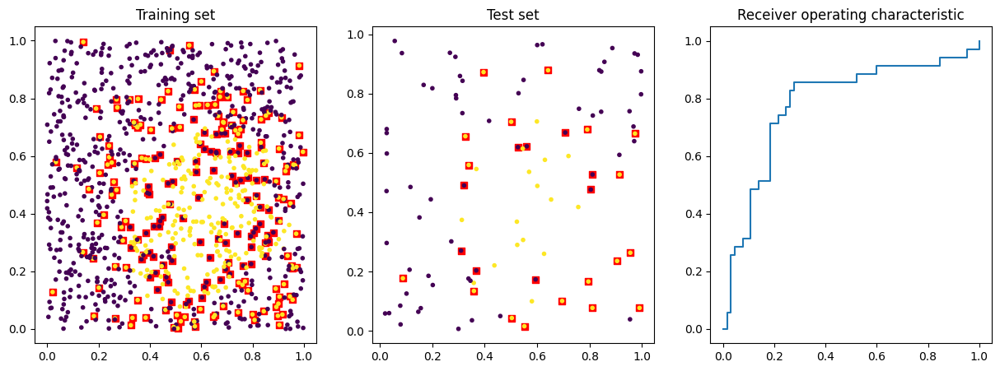

Testing C=10, gamma=0.01
Training data:
Confusion matrix:
 [[645   0]
 [355   0]]
Recall 100.00%, precision 64.50%, f1-measure 78.42%
Test data:
Confusion matrix:
 [[71  0]
 [29  0]]
Recall 100.00%, precision 71.00%, f1-measure 83.04%


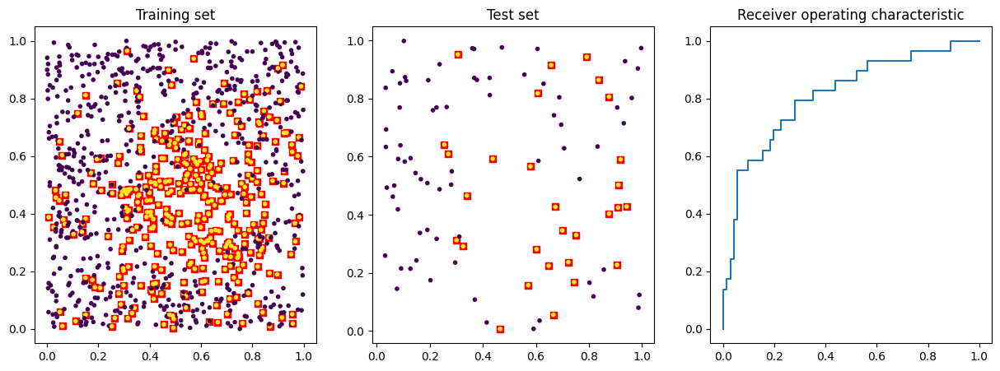

Testing C=10, gamma=0.1
Training data:
Confusion matrix:
 [[641   0]
 [359   0]]
Recall 100.00%, precision 64.10%, f1-measure 78.12%
Test data:
Confusion matrix:
 [[67  0]
 [33  0]]
Recall 100.00%, precision 67.00%, f1-measure 80.24%


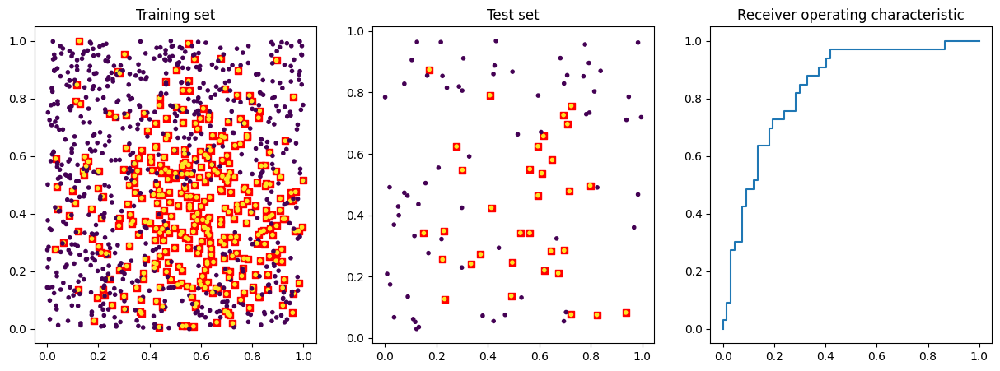

Testing C=10, gamma=1
Training data:
Confusion matrix:
 [[573  87]
 [122 218]]
Recall 86.82%, precision 82.45%, f1-measure 84.58%
Test data:
Confusion matrix:
 [[52 12]
 [13 23]]
Recall 81.25%, precision 80.00%, f1-measure 80.62%


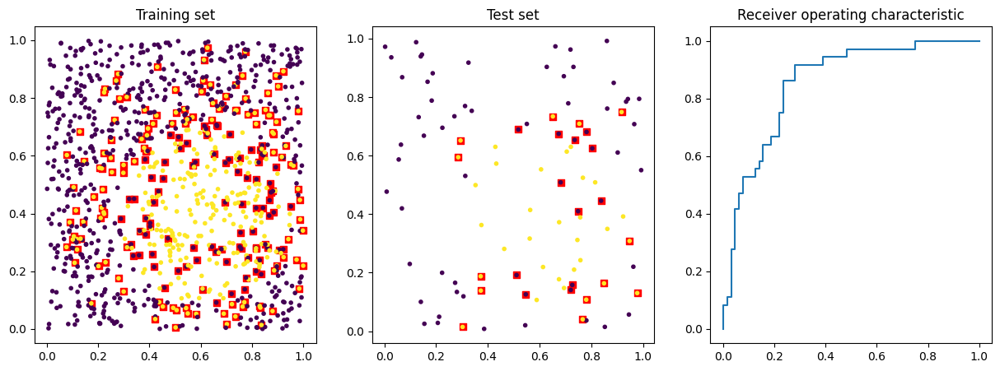

Testing C=10, gamma=10
Training data:
Confusion matrix:
 [[544  95]
 [134 227]]
Recall 85.13%, precision 80.24%, f1-measure 82.61%
Test data:
Confusion matrix:
 [[56 11]
 [ 9 24]]
Recall 83.58%, precision 86.15%, f1-measure 84.85%


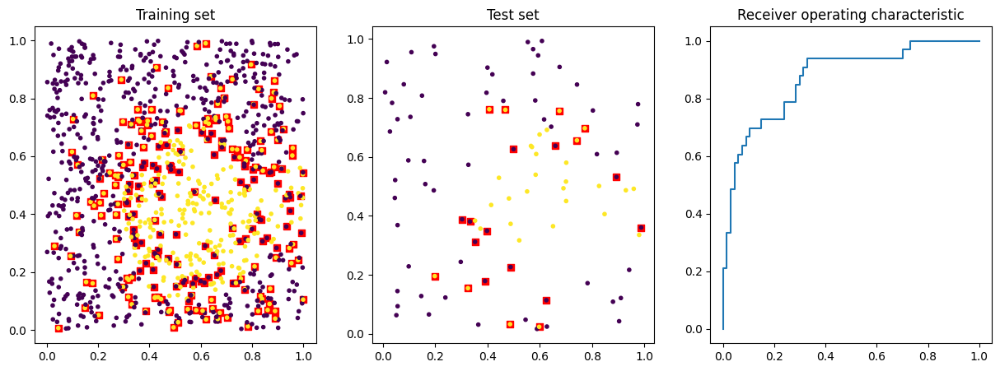

Testing C=10, gamma=100
Training data:
Confusion matrix:
 [[569  79]
 [109 243]]
Recall 87.81%, precision 83.92%, f1-measure 85.82%
Test data:
Confusion matrix:
 [[61  8]
 [ 8 23]]
Recall 88.41%, precision 88.41%, f1-measure 88.41%


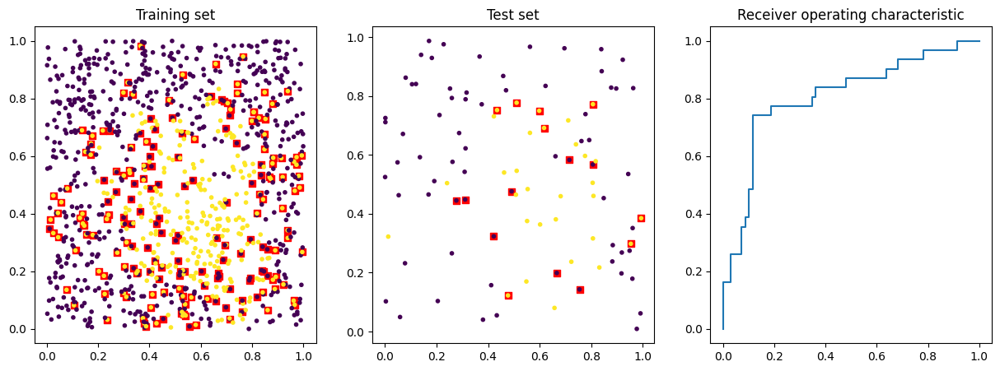

Testing C=100, gamma=0.01
Training data:
Confusion matrix:
 [[645   0]
 [355   0]]
Recall 100.00%, precision 64.50%, f1-measure 78.42%
Test data:
Confusion matrix:
 [[71  0]
 [29  0]]
Recall 100.00%, precision 71.00%, f1-measure 83.04%


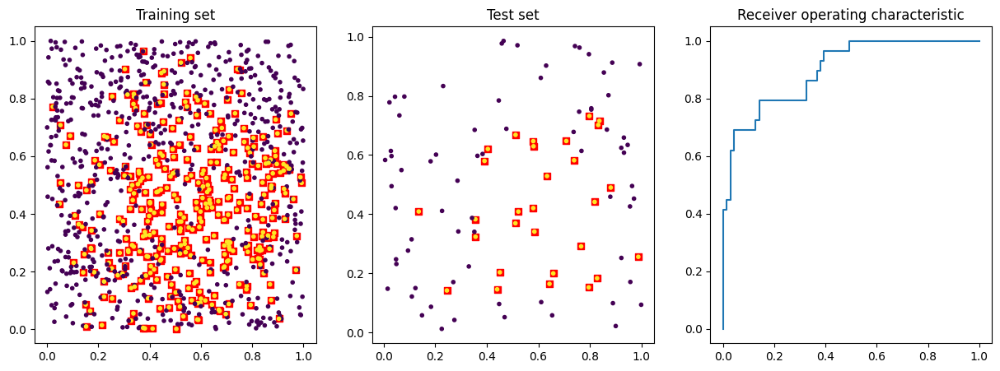

Testing C=100, gamma=0.1
Training data:
Confusion matrix:
 [[507 127]
 [102 264]]
Recall 79.97%, precision 83.25%, f1-measure 81.58%
Test data:
Confusion matrix:
 [[49 17]
 [ 8 26]]
Recall 74.24%, precision 85.96%, f1-measure 79.67%


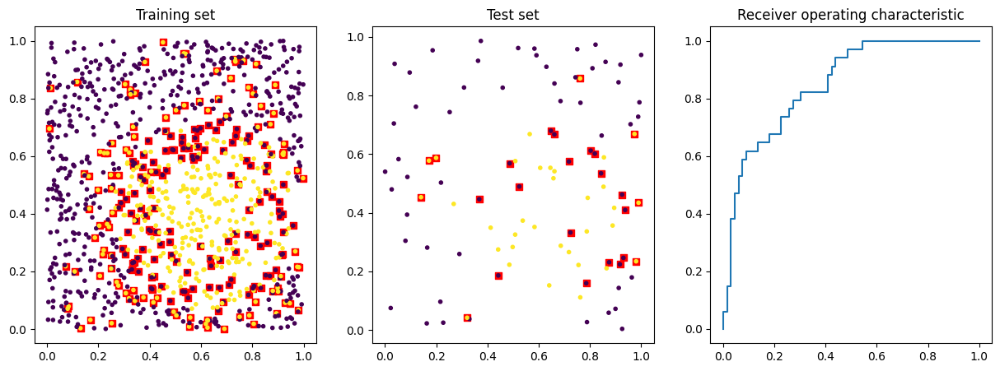

Testing C=100, gamma=1
Training data:
Confusion matrix:
 [[578  89]
 [149 184]]
Recall 86.66%, precision 79.50%, f1-measure 82.93%
Test data:
Confusion matrix:
 [[52 12]
 [16 20]]
Recall 81.25%, precision 76.47%, f1-measure 78.79%


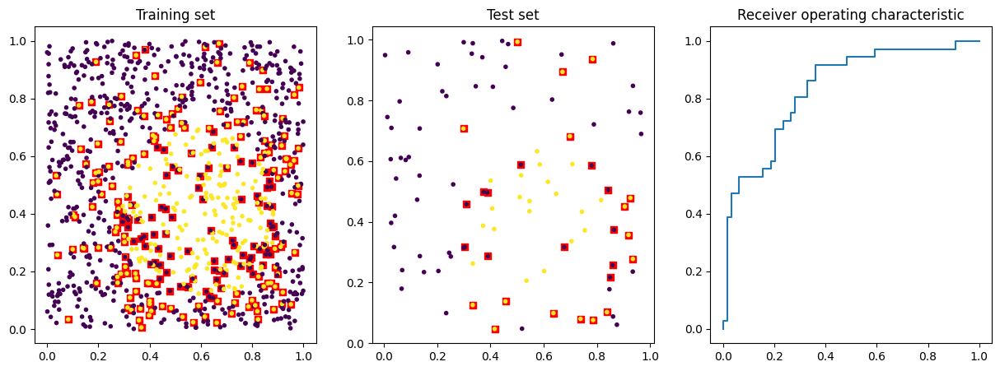

Testing C=100, gamma=10
Training data:
Confusion matrix:
 [[558  81]
 [141 220]]
Recall 87.32%, precision 79.83%, f1-measure 83.41%
Test data:
Confusion matrix:
 [[57 11]
 [ 9 23]]
Recall 83.82%, precision 86.36%, f1-measure 85.07%


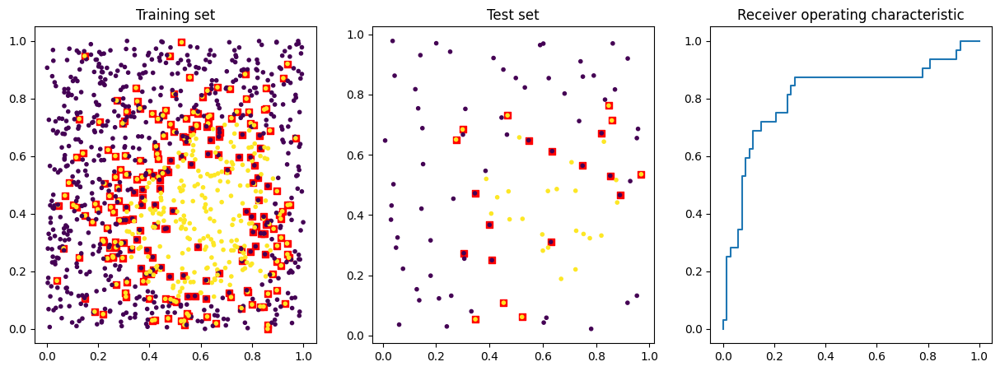

Testing C=100, gamma=100
Training data:
Confusion matrix:
 [[603  64]
 [103 230]]
Recall 90.40%, precision 85.41%, f1-measure 87.84%
Test data:
Confusion matrix:
 [[51 12]
 [19 18]]
Recall 80.95%, precision 72.86%, f1-measure 76.69%


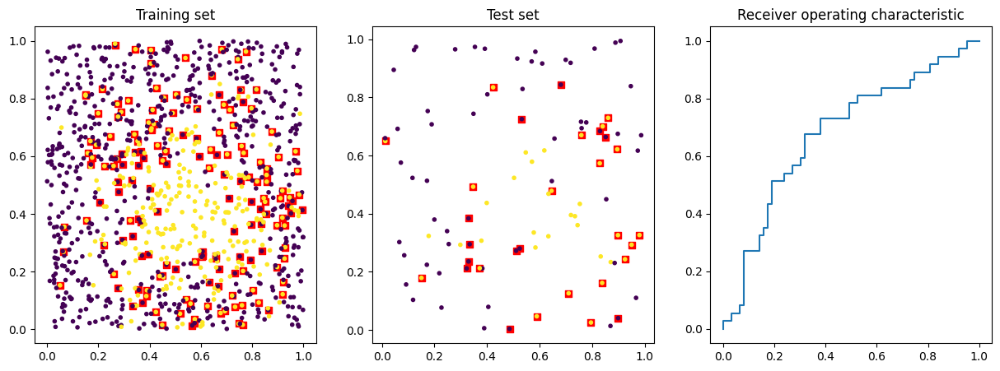

In [7]:
C_values = [0.01, 0.1, 1, 10, 100]
gamma_values = [0.01, 0.1, 1, 10, 100]

for C in C_values:
    for gamma in gamma_values:
        print(colored(f"Testing C={C}, gamma={gamma}", "blue"))
        clf = svm.SVC(C=C, gamma=gamma)
        benchmark_classifier(clf, problem)

In [8]:
from sklearn.model_selection import GridSearchCV

def grid_search_on_problem(problem, classifier, param_grid, n_training_samples=1000, n_test_samples=100, cv=5, scoring='accuracy'):
    training_x, training_y = problem.sample(nitems=n_training_samples)
    test_x, test_y = problem.sample(nitems=n_test_samples)

    grid_search = GridSearchCV(classifier, param_grid, cv=cv, scoring=scoring)
    grid_search.fit(training_x, training_y)

    print(colored(f"Best parameters: {grid_search.best_params_}", "green"))
    print(colored(f"Best cross-validation score: {grid_search.best_score_:.2f}", "green"))

    best_clf = grid_search.best_estimator_
    y_predicted_test = best_clf.predict(test_x)
    print(colored("Test set performance with best parameters:", "blue"))
    print_metrics(test_y, y_predicted_test)

    return best_clf
    
param_grid = {
    'C': C_values,
    'gamma': gamma_values
}

Best parameters: {'C': 100, 'gamma': 1}
Best cross-validation score: 0.81
Test set performance with best parameters:
Confusion matrix:
 [[63  8]
 [16 13]]
Recall 88.73%, precision 79.75%, f1-measure 84.00%
Training data:
Confusion matrix:
 [[573  93]
 [127 207]]
Recall 86.04%, precision 81.86%, f1-measure 83.89%
Test data:
Confusion matrix:
 [[59  7]
 [15 19]]
Recall 89.39%, precision 79.73%, f1-measure 84.29%


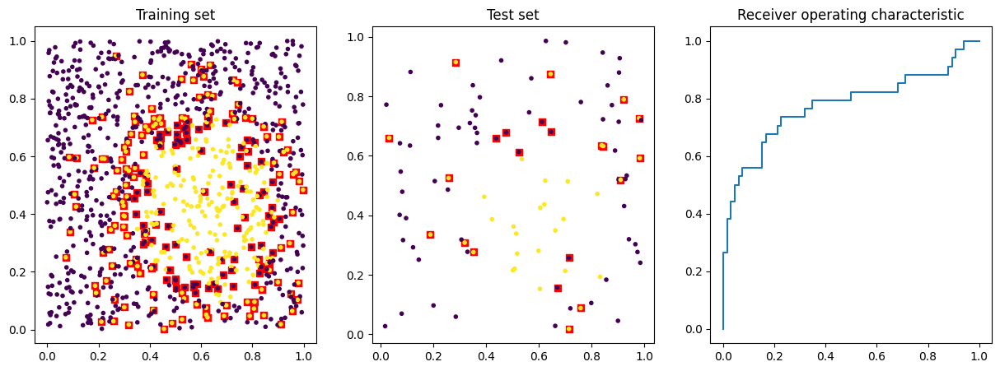

In [9]:
clf = svm.SVC()

best_clf = grid_search_on_problem(problem, clf, param_grid)
benchmark_classifier(best_clf, problem)

Best parameters: {'C': 1, 'gamma': 1}
Best cross-validation score: 0.66
Test set performance with best parameters:
Confusion matrix:
 [[51 15]
 [10 24]]
Recall 77.27%, precision 83.61%, f1-measure 80.31%
Training data:
Confusion matrix:
 [[547  97]
 [136 220]]
Recall 84.94%, precision 80.09%, f1-measure 82.44%
Test data:
Confusion matrix:
 [[53 15]
 [12 20]]
Recall 77.94%, precision 81.54%, f1-measure 79.70%


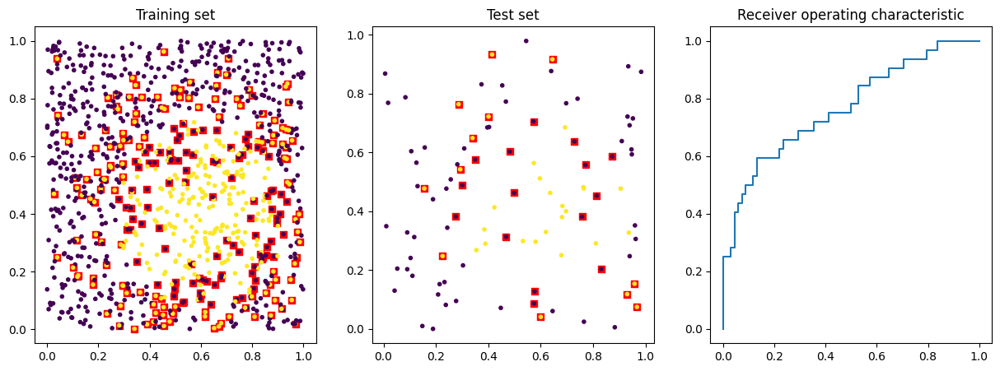

In [10]:
clf = svm.SVC()

best_clf = grid_search_on_problem(problem, clf, param_grid, scoring='f1')
benchmark_classifier(best_clf, problem)

4. Compare classifiers [`KNeighborsClassifier`](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html) impl, [k-nearest neighbors algorithm
](https://en.wikipedia.org/wiki/K-nearest_neighbors_algorithm), 
[`SVC`](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html) impl. [support-vector_machine](https://en.wikipedia.org/wiki/Support-vector_machine) with different kernels, 
[`RandomForestClassifier`](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html) impl. [random forest method](https://ru.wikipedia.org/wiki/Random_forest)
from sklearn on `GaussProblem`, you may found usefull [this example](https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html). Explain difference in the performance of the classifiers.

In [11]:
def benchmark_classifier(clf, problem, n_training_samples=1000, n_test_samples=100):
    training_x, training_y = problem.sample(nitems=n_training_samples)
    test_x, test_y = problem.sample(nitems=n_test_samples)

    clf.fit(training_x, training_y)

    y_predicted = clf.predict(training_x)
    y_predicted_test = clf.predict(test_x)

    print(colored("Training data:","yellow"))
    print_metrics(training_y, y_predicted)

    print(colored("Test data:",'green'))
    print_metrics(test_y, y_predicted_test)


    fig, (axis1, axis2, axis3) = plt.subplots(ncols=3, figsize=(15, 5))

    visualize(training_x, training_y, y_predicted, axis=axis1)
    axis1.set_title('Training set')

    visualize(test_x, test_y, y_predicted_test, axis=axis2)
    axis2.set_title('Test set')

    if hasattr(clf, "decision_function"):
        scores = clf.decision_function(test_x)
    elif hasattr(clf, "predict_proba"):
        scores = clf.predict_proba(test_x)[:, 1]  # Use probability for ROC curve
    else:
        scores = clf.predict(test_x)
        
    fpr, tpr, thresholds = metrics.roc_curve(test_y, scores)
    axis3.plot(fpr, tpr)
    axis3.set_title('Receiver operating characteristic')

    plt.show()

Classifier: KNeighborsClassifier
Training data:
Confusion matrix:
 [[596  60]
 [104 240]]
Recall 90.85%, precision 85.14%, f1-measure 87.91%
Test data:
Confusion matrix:
 [[56 11]
 [11 22]]
Recall 83.58%, precision 83.58%, f1-measure 83.58%


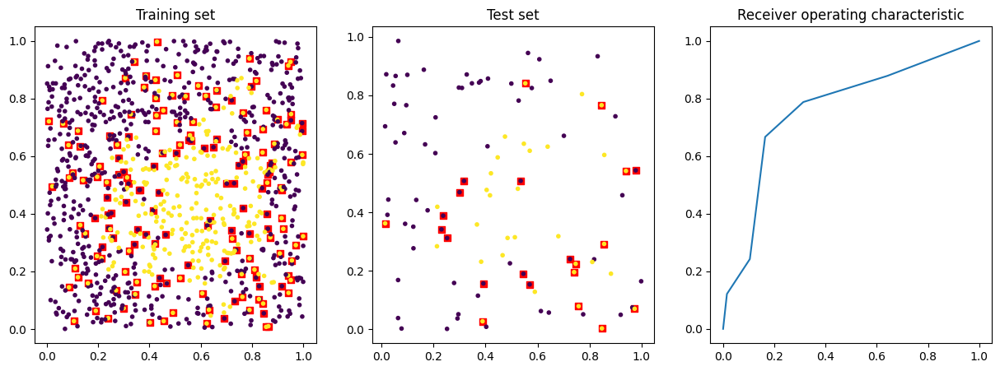

Classifier: SVC (linear)
Training data:
Confusion matrix:
 [[667   0]
 [333   0]]
Recall 100.00%, precision 66.70%, f1-measure 80.02%
Test data:
Confusion matrix:
 [[71  0]
 [29  0]]
Recall 100.00%, precision 71.00%, f1-measure 83.04%


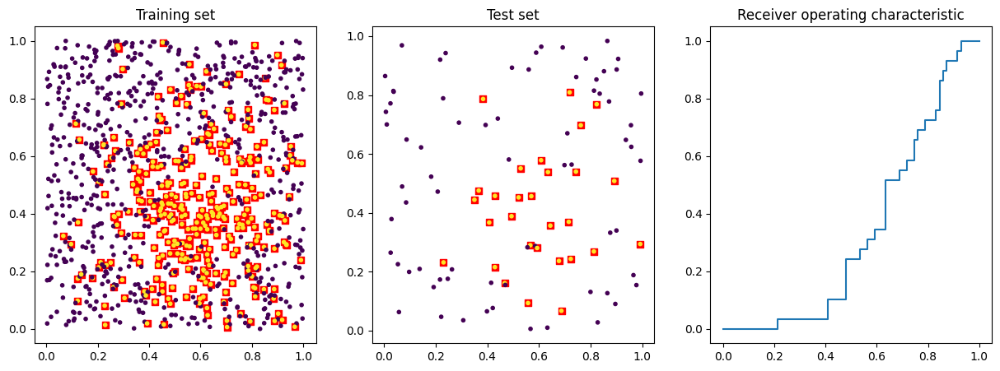

Classifier: SVC (rbf)
Training data:
Confusion matrix:
 [[588  57]
 [170 185]]
Recall 91.16%, precision 77.57%, f1-measure 83.82%
Test data:
Confusion matrix:
 [[54  9]
 [17 20]]
Recall 85.71%, precision 76.06%, f1-measure 80.60%


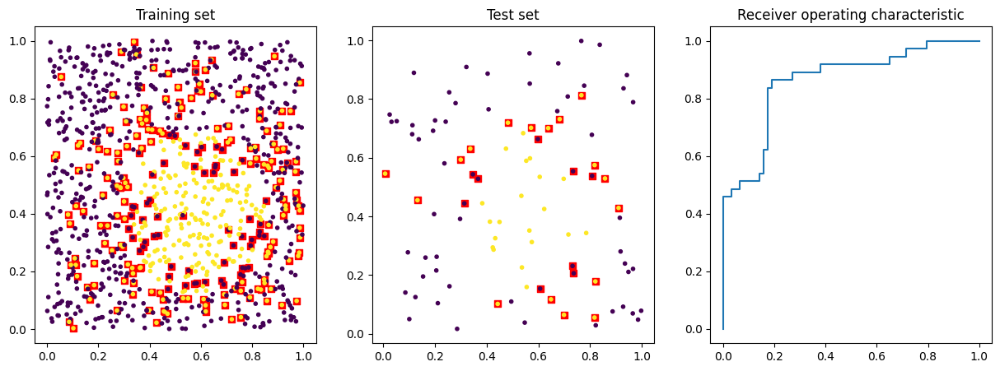

Classifier: RandomForestClassifier
Training data:
Confusion matrix:
 [[573  77]
 [132 218]]
Recall 88.15%, precision 81.28%, f1-measure 84.58%
Test data:
Confusion matrix:
 [[66  4]
 [13 17]]
Recall 94.29%, precision 83.54%, f1-measure 88.59%


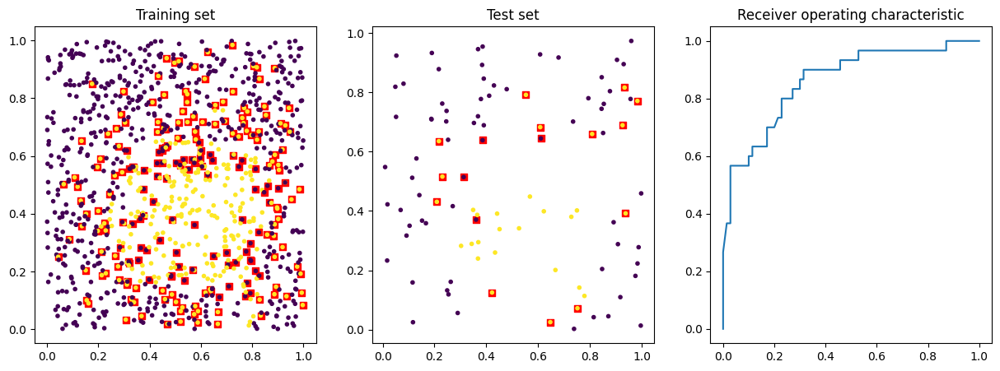

In [12]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

classifiers = {
    "KNeighborsClassifier": KNeighborsClassifier(n_neighbors=5),
    "SVC (linear)": svm.SVC(kernel='linear'),
    "SVC (rbf)": svm.SVC(kernel='rbf'),
    "RandomForestClassifier": RandomForestClassifier(max_depth=5, n_estimators=10)
}

for name, clf in classifiers.items():
    print(colored(f"Classifier: {name}", "blue"))
    benchmark_classifier(clf, problem)

Test accuracy: 0.77
Test accuracy: 0.64
Test accuracy: 0.79
Test accuracy: 0.80


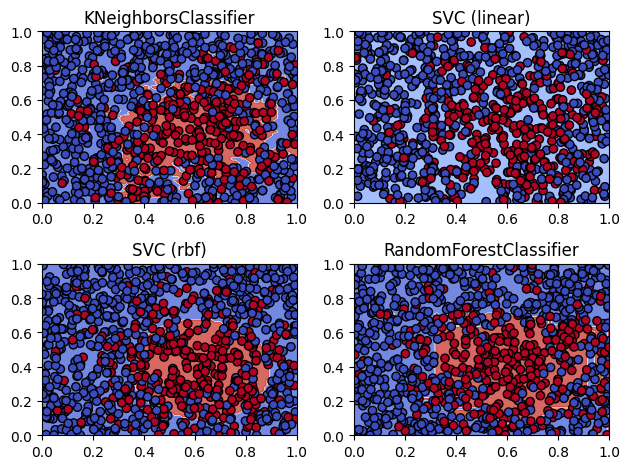

In [13]:
fig, axes = plt.subplots(2, 2)
axes = axes.ravel()

for i, (name, clf) in enumerate(classifiers.items()):
    training_x, training_y = problem.sample(nitems=1000)
    clf.fit(training_x, training_y)
    x_min, x_max = 0, 1
    y_min, y_max = 0, 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    grid_points = np.c_[xx.ravel(), yy.ravel()]
    Z = clf.predict(grid_points)
    Z = Z.reshape(xx.shape)
    
    axes[i].contourf(xx, yy, Z, alpha=0.8, cmap=plt.cm.coolwarm)
    axes[i].scatter(training_x[:, 0], training_x[:, 1], c=training_y, edgecolors='k', cmap=plt.cm.coolwarm)
    axes[i].set_title(name)
    axes[i].set_xlim(x_min, x_max)
    axes[i].set_ylim(y_min, y_max)
    
    test_x, test_y = problem.sample(nitems=100)
    y_predicted = clf.predict(test_x)
    accuracy = metrics.accuracy_score(test_y, y_predicted)
    print(colored(f"Test accuracy: {accuracy:.2f}", "green"))

plt.tight_layout()
plt.show()

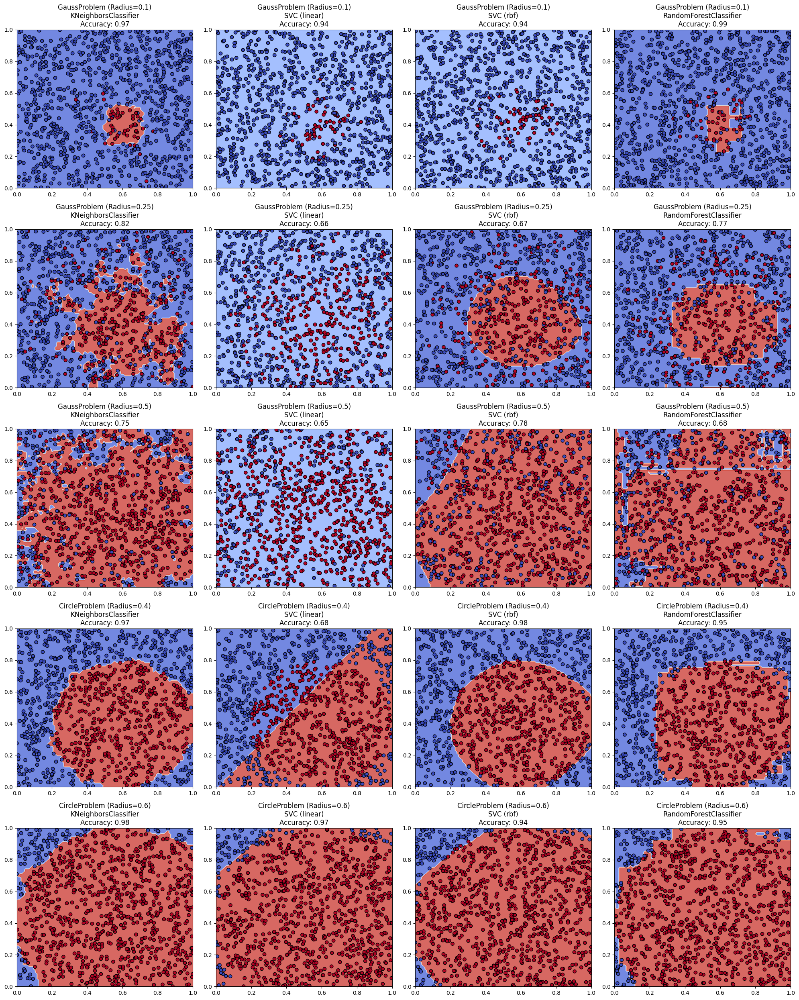

In [14]:
problems = {
    "GaussProblem (Radius=0.1)": GaussProblem(center=(0.6, 0.4), radius=0.1),
    "GaussProblem (Radius=0.25)": GaussProblem(center=(0.6, 0.4), radius=0.25),
    "GaussProblem (Radius=0.5)": GaussProblem(center=(0.6, 0.4), radius=0.5),
    "CircleProblem (Radius=0.4)": CircleProblem(center=(0.6, 0.4), radius=0.4),
    "CircleProblem (Radius=0.6)": CircleProblem(center=(0.6, 0.4), radius=0.6)
}
n_problems = len(problems)
n_classifiers = len(classifiers)
fig, axes = plt.subplots(n_problems, n_classifiers, figsize=(5 * n_classifiers, 5 * n_problems))

for i, (problem_name, problem) in enumerate(problems.items()):
    for j, (clf_name, clf) in enumerate(classifiers.items()):
        training_x, training_y = problem.sample(nitems=1000)
        clf.fit(training_x, training_y)
        
        x_min, x_max = 0, 1
        y_min, y_max = 0, 1
        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
        grid_points = np.c_[xx.ravel(), yy.ravel()]
        
        Z = clf.predict(grid_points)
        Z = Z.reshape(xx.shape)
        
        ax = axes[i, j]
        ax.contourf(xx, yy, Z, alpha=0.8, cmap=plt.cm.coolwarm)
        ax.scatter(training_x[:, 0], training_x[:, 1], c=training_y, edgecolors='k', cmap=plt.cm.coolwarm)
        
        test_x, test_y = problem.sample(nitems=100)
        y_predicted = clf.predict(test_x)
        accuracy = metrics.accuracy_score(test_y, y_predicted)
        
        ax.set_title(f"{problem_name}\n{clf_name}\nAccuracy: {accuracy:.2f}")
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)

plt.tight_layout()
plt.show()

Among presented problems: CircleProblem aims to distinguish between classes with a defined and certain bondary. If the method allows for finding boundary shape it suits perfectly. On the other hand, GaussProblem does not present certain boundaries and requires a decision algorithm to determine how many samples of class could be ignored (be referred to another class).

We can notice that KNeighbours classifier struggles in GaussProblem and does not determine shape in any Problem. Linear SVC does not suite for Circle or Gauss problems but rbf SVC works just fine for all cases except small radiuses.

Among these methods Random Forest is a winner and does not struggle in any of the problems presented.

5. Derive class `EllipseProblem` from `TestProblem` that generates plots of Ellipse. Increase dimensionality of the features space and use `KNeighborsClassifier`, do you see any effects of [curse of dimensionality?](https://en.wikipedia.org/wiki/Curse_of_dimensionality)


Horizontal Ellipse


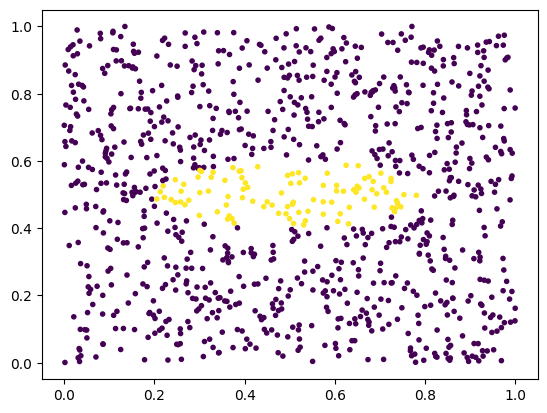

Training data:
Confusion matrix:
 [[895   5]
 [  9  91]]
Recall 99.44%, precision 99.00%, f1-measure 99.22%
Test data:
Confusion matrix:
 [[88  0]
 [ 2 10]]
Recall 100.00%, precision 97.78%, f1-measure 98.88%


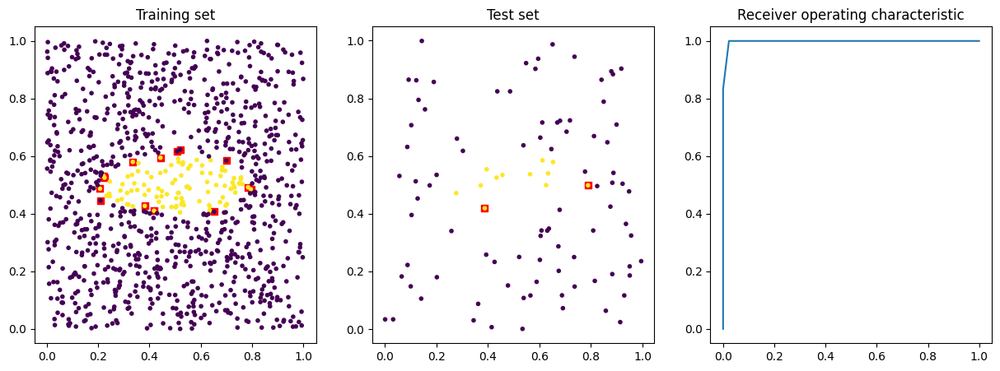


Vertical Ellipse


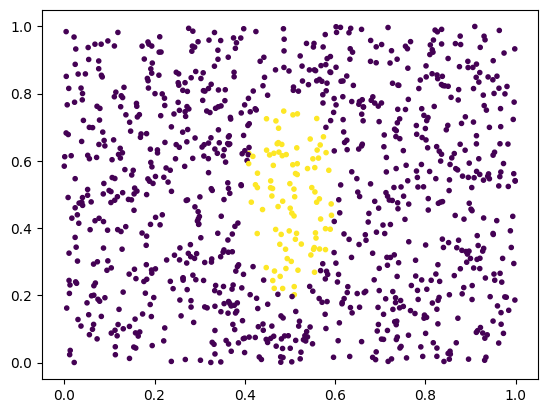

Training data:
Confusion matrix:
 [[896   5]
 [  4  95]]
Recall 99.45%, precision 99.56%, f1-measure 99.50%
Test data:
Confusion matrix:
 [[88  1]
 [ 0 11]]
Recall 98.88%, precision 100.00%, f1-measure 99.44%


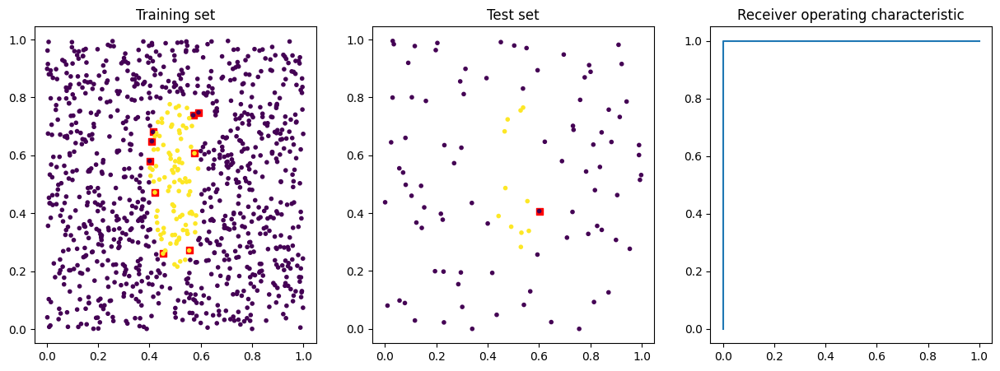


Rotated 45° Ellipse


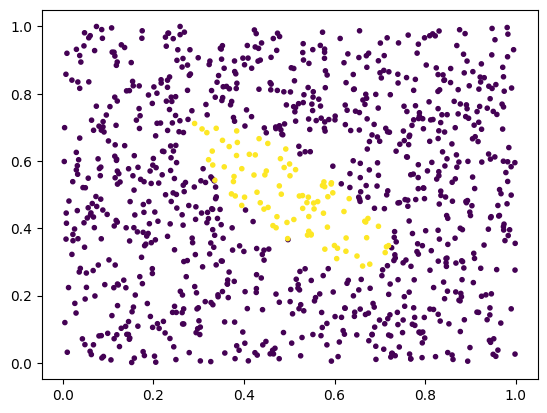

Training data:
Confusion matrix:
 [[911   1]
 [  4  84]]
Recall 99.89%, precision 99.56%, f1-measure 99.73%
Test data:
Confusion matrix:
 [[87  0]
 [ 0 13]]
Recall 100.00%, precision 100.00%, f1-measure 100.00%


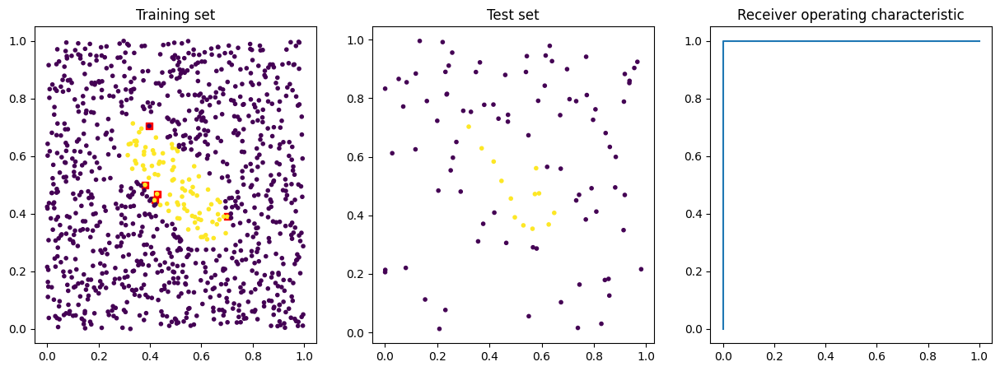


Rotated 30° Ellipse


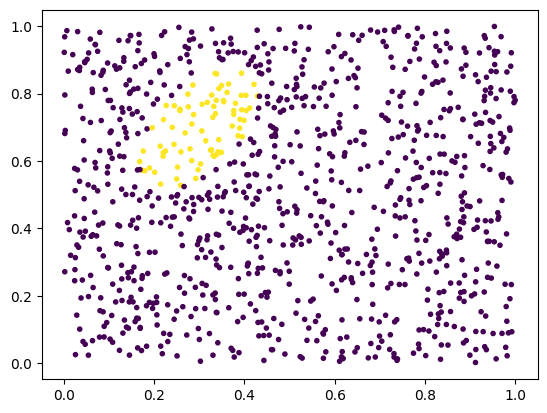

Training data:
Confusion matrix:
 [[931   4]
 [  2  63]]
Recall 99.57%, precision 99.79%, f1-measure 99.68%
Test data:
Confusion matrix:
 [[93  0]
 [ 0  7]]
Recall 100.00%, precision 100.00%, f1-measure 100.00%


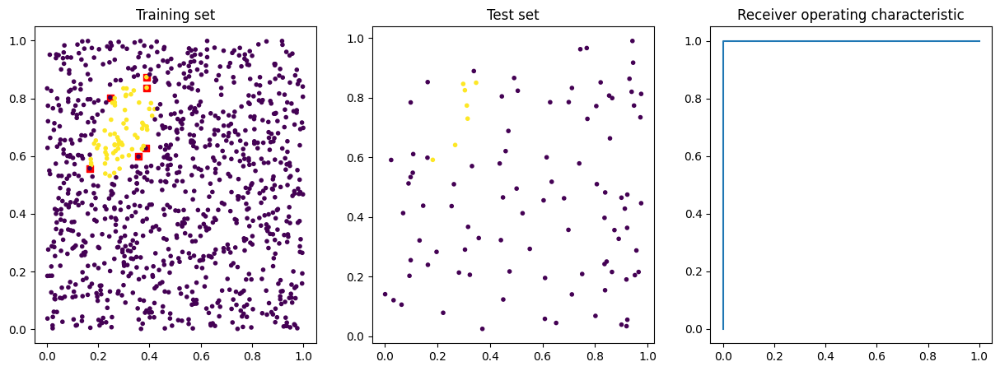

In [15]:
class EllipseProblem(TestProblem):
    def __init__(self, center: np.ndarray, a: float, b: float, angle: float = 0.0):
        self._center = np.array(center)
        self._a = np.float32(a)
        self._b = np.float32(b)
        self._angle = np.float32(angle)
        assert self._center.ndim == 1

    def sample(self, nitems):
        x = np.random.rand(nitems, self._center.shape[0])
        translated = x - self._center
        rot_matrix = np.array([
            [np.cos(self._angle), -np.sin(self._angle)],
            [np.sin(self._angle), np.cos(self._angle)]
        ])
        rotated = translated @ rot_matrix.T
        distance = (rotated[:, 0]**2 / self._a**2) + (rotated[:, 1]**2 / self._b**2)
        y = distance <= 1
        return x, y

configurations = [
    ("Horizontal Ellipse", {"center": (0.5, 0.5), "a": 0.3, "b": 0.1, "angle": 0}),
    ("Vertical Ellipse", {"center": (0.5, 0.5), "a": 0.1, "b": 0.3, "angle": 0}),
    ("Rotated 45° Ellipse", {"center": (0.5, 0.5), "a": 0.3, "b": 0.1, "angle": np.pi/4}),
    ("Rotated 30° Ellipse", {"center": (0.3, 0.7), "a": 0.1, "b": 0.2, "angle": np.pi/6})
]

for name, params in configurations:
    print(f"\n{colored(name, 'blue')}")
    problem = EllipseProblem(**params)
    problem.visualize()
    plt.show()
    
    clf = KNeighborsClassifier(n_neighbors=5)
    benchmark_classifier(clf, problem)

6. Select [important features](https://en.wikipedia.org/wiki/Feature_selection) used by the classifier for `FunctionProblem`. Apply the [principal component analysis](https://en.wikipedia.org/wiki/Principal_component_analysis) and visualize the result. Try to eliminate all features except of the important ones, and check performance of the classifier on the important features. Can you explain, how the classifier decides which class an example belongs to?

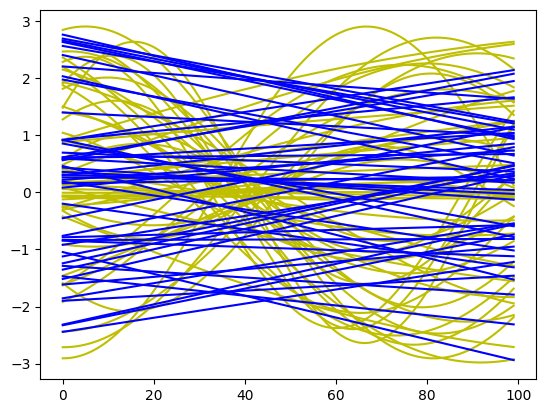

In [16]:
class FunctionProblem(TestProblem):
    def __init__(self, N: int):
        self._N = np.int32(N)
        assert self._N>0
        self._t = np.linspace(-.5,0.5,self._N)
     
    @property
    def t(self):
        return self._t
    
    def sample_zero_class(self, nitems):
        A = np.random.uniform(-3., 3., size=nitems)[:,None]
        B = np.random.uniform(0., 2*np.pi, size=nitems)[:,None]
        C = np.random.uniform(0., 1., size=nitems)[:,None]
        return A*np.sin(B*self.t[None]+C)
    
    def sample_first_class(self, nitems):
        D = np.random.uniform(-2., 2., size=nitems)[:,None]
        E = np.random.uniform(-2., 2., size=nitems)[:,None]
        return D*self.t[None]+E
    
        
    def sample(self, nitems):
        nitems0 = nitems//2
        nitems1 = nitems - nitems0
        x = np.concatenate((self.sample_zero_class(nitems0), self.sample_first_class(nitems1)), axis=0)
        y = np.concatenate((np.zeros(nitems0), np.ones(nitems1)), axis=0)
        assert x.shape == (nitems, self._N)
        assert y.shape == (nitems,)        
        perm = np.random.permutation(nitems)
        return x[perm], y[perm]
    
problem = FunctionProblem(N=100)
problem.visualize(100)
plt.show()

In [17]:
from sklearn.base import BaseEstimator, TransformerMixin

class PCAProblem(FunctionProblem):
    def __init__(self, original_problem, pca):
        self.original_problem = original_problem
        self.pca = pca

    def sample(self, nitems):
        x, y = self.original_problem.sample(nitems)
        x_transformed = self.pca.transform(x)
        return x_transformed, y

class FeatureSelectedProblem(FunctionProblem):
    def __init__(self, original_problem, selector):
        self.original_problem = original_problem
        self.selector = selector

    def sample(self, nitems):
        x, y = self.original_problem.sample(nitems)
        x_transformed = self.selector.transform(x)
        return x_transformed, y

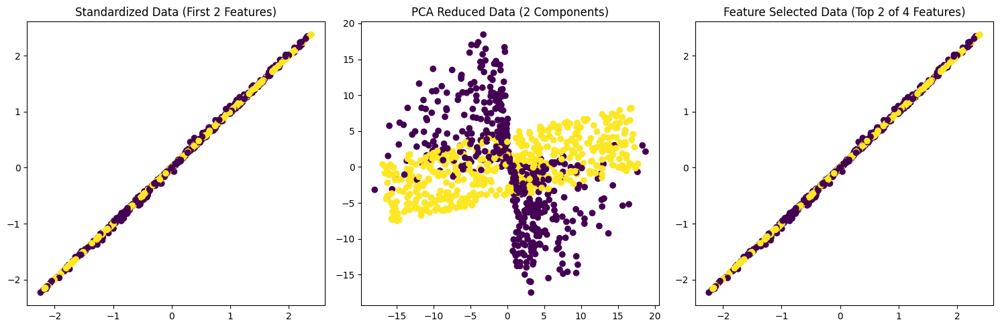

In [26]:
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler

x, y = problem.sample(1000)

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

pca = PCA(n_components=2)
x_pca = pca.fit_transform(x_scaled)

selector = SelectKBest(f_classif, k=4)
x_selected = selector.fit_transform(x_scaled, y)

fig, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(15, 5))

ax0.scatter(x_scaled[:, 0], x_scaled[:, 1], c=y)
ax0.set_title('Standardized Data (First 2 Features)')

ax1.scatter(x_pca[:, 0], x_pca[:, 1], c=y)
ax1.set_title('PCA Reduced Data (2 Components)')

ax2.scatter(x_selected[:, 0], x_selected[:, 1], c=y)
ax2.set_title('Feature Selected Data (Top 2 of 4 Features)')

plt.tight_layout()
plt.show()

Non-Reduced Data:
Training data:
Confusion matrix:
 [[441  59]
 [ 31 469]]
Recall 88.20%, precision 93.43%, f1-measure 90.74%
Test data:
Confusion matrix:
 [[45  5]
 [ 8 42]]
Recall 90.00%, precision 84.91%, f1-measure 87.38%


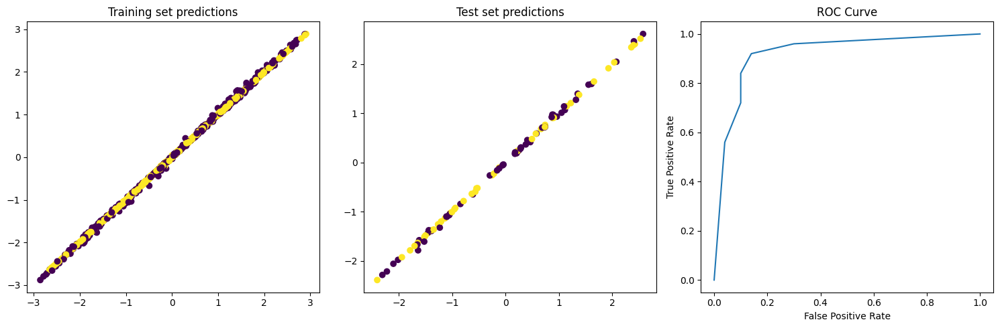

PCA Reduced Data:
Training data:
Confusion matrix:
 [[436  64]
 [ 54 446]]
Recall 87.20%, precision 88.98%, f1-measure 88.08%
Test data:
Confusion matrix:
 [[44  6]
 [ 7 43]]
Recall 88.00%, precision 86.27%, f1-measure 87.13%


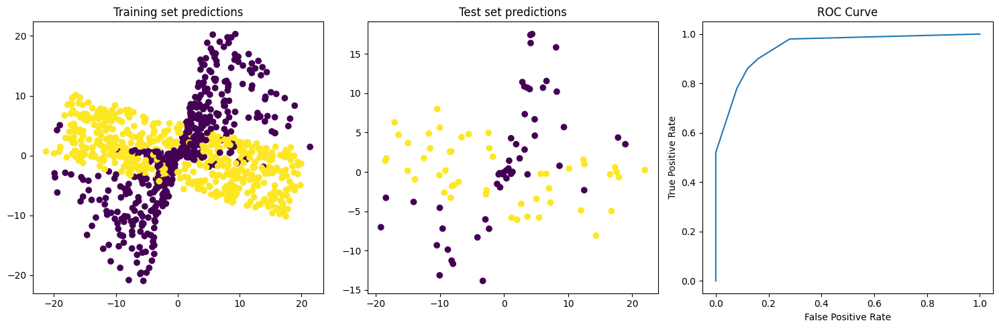

Feature Selected Data:
Training data:
Confusion matrix:
 [[421  79]
 [ 84 416]]
Recall 84.20%, precision 83.37%, f1-measure 83.78%
Test data:
Confusion matrix:
 [[40 10]
 [14 36]]
Recall 80.00%, precision 74.07%, f1-measure 76.92%


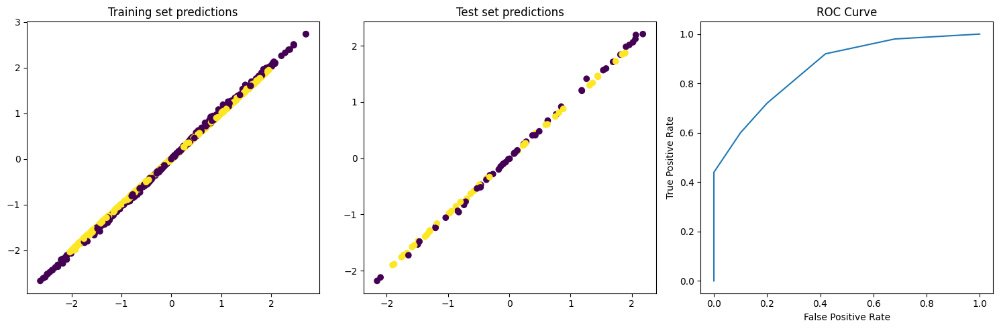

In [25]:
def reduced_benchmark_classifier(clf, problem, n_training_samples=1000, n_test_samples=100):
    training_x, training_y = problem.sample(nitems=n_training_samples)
    test_x, test_y = problem.sample(nitems=n_test_samples)
    clf.fit(training_x, training_y)

    y_predicted = clf.predict(training_x)
    y_predicted_test = clf.predict(test_x)

    print(colored("Training data:", "yellow"))
    print_metrics(training_y, y_predicted)

    print(colored("Test data:", "green"))
    print_metrics(test_y, y_predicted_test)

    fig, (axis1, axis2, axis3) = plt.subplots(ncols=3, figsize=(15, 5))
    
    axis1.scatter(training_x[:, 0], training_x[:, 1], c=y_predicted)
    axis1.set_title('Training set predictions')
    axis2.scatter(test_x[:, 0], test_x[:, 1], c=y_predicted_test)
    axis2.set_title('Test set predictions')
    if hasattr(clf, "decision_function"):
        scores = clf.decision_function(test_x)
    elif hasattr(clf, "predict_proba"):
        scores = clf.predict_proba(test_x)[:, 1]
    else:
        scores = y_predicted_test
    fpr, tpr, _ = metrics.roc_curve(test_y, scores)
    axis3.plot(fpr, tpr)
    axis3.set_title('ROC Curve')
    axis3.set_xlabel('False Positive Rate')
    axis3.set_ylabel('True Positive Rate')

    plt.tight_layout()
    plt.show()

clf = KNeighborsClassifier(n_neighbors=5)

print(colored("Non-Reduced Data:", "blue"))
reduced_benchmark_classifier(clf, problem)

print(colored("PCA Reduced Data:", "blue"))
pca_problem = PCAProblem(problem, pca)
reduced_benchmark_classifier(clf, pca_problem)

print(colored("Feature Selected Data:", "blue"))
feature_selected_problem = FeatureSelectedProblem(problem, selector)
reduced_benchmark_classifier(clf, feature_selected_problem)